In [25]:
import pandas as pd
import numpy as np
import pandas as pd
import numpy as np
import re
import string
import unicodedata
import plotly_express as px
import plotly.io as pio
from sklearn import preprocessing
import pandas_profiling
import datetime
%matplotlib inline
import matplotlib.style
import matplotlib as mpl
import matplotlib.pyplot as plt 
from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")


In [2]:
pwd

'/Users/joaocamargo/macHD/GITHUB/TCC-PUCRS-2020'

In [3]:
ls -ltr Data/

total 9424
-rw-r--r--  1 joaocamargo  staff  3301959 Apr 21 10:13 count_day_type.csv
-rw-r--r--  1 joaocamargo  staff   124920 Apr 21 10:13 count_day.csv
-rw-r--r--  1 joaocamargo  staff    24972 Apr 21 10:13 count_week_day_type.csv
-rw-r--r--  1 joaocamargo  staff      138 Apr 21 10:13 count_week_day.csv
-rw-r--r--  1 joaocamargo  staff   386439 Apr 21 10:13 count_year_month_type.csv
-rw-r--r--  1 joaocamargo  staff     4827 Apr 21 10:13 count_year_month.csv


In [4]:
df_count_day_type = pd.read_csv('./Data/count_day_type.csv',sep=",",encoding='ascii')
df_count_week_day_type = pd.read_csv('Data/count_week_day_type.csv',sep=",",encoding='ascii')
df_count_year_month_type = pd.read_csv('Data/count_year_month_type.csv',sep=",",encoding='ascii')

#df_count_day = pd.read_csv('TCC_DATA/count_day.csv',sep=",",encoding='ascii')
#df_count_week_day = pd.read_csv('TCC_DATA/count_week_day.csv',sep=",",encoding='ascii')
#df_count_year_month = pd.read_csv('TCC_DATA/count_year_month.csv',sep=",",encoding='ascii')

del df_count_day_type['Unnamed: 0']
#del df_count_day['Unnamed: 0']
del df_count_week_day_type['Unnamed: 0']
#del df_count_week_day['Unnamed: 0']
del df_count_year_month_type['Unnamed: 0']
#del df_count_year_month['Unnamed: 0']

In [5]:
#dataFrames = [df_count_day_type,df_count_day,df_count_week_day_type,df_count_week_day,df_count_year_month_type,df_count_year_month]
dataFrames = [df_count_day_type,df_count_week_day_type,df_count_year_month_type]
for df in dataFrames:
    display(df.head(1))

,judgmentDate,type,count
0,2000-01-03,Agravo de Instrumento,2


,weekDay,type,count
0,Sun,A\xc3\xa7\xc3\xa3o Civil P\xc3\xbablica,2


,yearMonth,type,count
0,2000-01-01,Agravo de Instrumento,12


In [6]:
for df in dataFrames:    
    print(df.columns)

Index(['judgmentDate', 'type', 'count'], dtype='object')
Index(['weekDay', 'type', 'count'], dtype='object')
Index(['yearMonth', 'type', 'count'], dtype='object')


In [7]:
#verificar feriados 
def isHoliday(dia,mes):
    if dia == 1:
        if mes == 1 or mes ==5:
            return(True)
    if (dia ==2 or dia==15) and mes==11:
        return(True)
    if (dia ==7 or dia==20) and mes == 9:
        return(True)
    if mes == 4 and (dia ==10 or dia ==12 or dia==21):
        return(True)
    if dia ==24 and mes == 6:
        return(True)
    if mes==10 and (dia==12 or dia==28):
        return(True)
    if mes==12 and dia ==25:
        return(True)
    return(False)   

In [8]:
#transformar data 
# adiciona coluna de dia da semana  (segunda=0,terça=1,quarta=2,quinta=3, sexta=4,sabado=5,domingo=6)
for df in [df_count_day_type]:
    if df['judgmentDate'].dtype != 'datetime64[ns]':
        character = df['judgmentDate'].str.replace('\d+','')[2][1]
        formato=''
        print('formato: ',df['judgmentDate'].str.find(character)[0])
        if df['judgmentDate'].str.find(character)[0] ==4:
            formato = '%Y{0}%m{0}%d'
        else:
            formato = '%d{0}%m{0}%Y'
        print(character)
    df['judgmentDate'] = pd.to_datetime(df['judgmentDate'],format=formato.format(character))
    df['weekDay'] = df['judgmentDate'].apply(lambda x: x.weekday())
    df['weekType'] = df['judgmentDate'].apply(lambda x: 'DiaSemana' if x.weekday()<5 else 'FimSemana')
    df['Dia'] = df['judgmentDate'].apply(lambda x: x.day)   
    df['Mes'] = df['judgmentDate'].apply(lambda x: x.month)  
    df['Ano'] = df['judgmentDate'].apply(lambda x: x.year)  
    df['Feriado'] = df['judgmentDate'].apply(lambda x: isHoliday(x.day,x.month))  

formato:  4
-


In [9]:
def elementdecode(x):
    #if the first condition if not met, the second is not evaluated
    if (type(x) == str):        
        bb=x.encode()
        cc = bb.decode('unicode-escape').encode('ISO-8859-1')                
        return(cc.decode('utf-8'))
    else:                
        return x.decode('utf-8')

In [10]:
df_count_day_type['type'] = df_count_day_type['type'].apply(lambda x: elementdecode(x))
df_count_week_day_type['type'] = df_count_week_day_type['type'].apply(lambda x: elementdecode(x))
df_count_year_month_type['type'] = df_count_year_month_type['type'].apply(lambda x: elementdecode(x))

In [11]:
for df in dataFrames:
    display(df.head(1))

,judgmentDate,type,count,weekDay,weekType,Dia,Mes,Ano,Feriado
0,2000-01-03,Agravo de Instrumento,2,0,DiaSemana,3,1,2000,False


,weekDay,type,count
0,Sun,Ação Civil Pública,2


,yearMonth,type,count
0,2000-01-01,Agravo de Instrumento,12


In [12]:
#display(df_count_day_type.groupby(['type','judgmentDate']).count().reset_index().sort_values(by='count',ascending=False))

#df_count_day_type["CountNorm"] = df_count_day_type["count"] / df_count_day_type["count"].max()
#df_count_day_type.head(3)

In [13]:
print('Contagem por dia comportamento')
tempdf = df_count_day_type

#definir data
tempdf = df_count_day_type[(df_count_day_type['judgmentDate'] > '2010-01-01') 
                           & (df_count_day_type['judgmentDate'] < '2011-12-31')]

#definir dia de semana ou fim de semana
#tempdf = tempdf[tempdf['weekType']=='DiaSemana']

#definir feriado 
tempdf = tempdf[tempdf['Feriado']==True]

scatter_plot = px.line(tempdf[['judgmentDate','count']], x="judgmentDate", y="count")
pio.show(scatter_plot)

Contagem por dia comportamento


In [14]:
#df_count_day_type[['judgmentDate','type','weekType','weekDay','count','Feriado','Dia','Mes','Ano']].profile_report();


In [15]:
print(df_count_day_type.columns)
df_count_day_type_top20 = df_count_day_type[['type','count']].groupby('type').aggregate({"count":"sum"}).reset_index().sort_values(by='count',ascending=False)
df_count_day_type_top20 = df_count_day_type_top20.head(20)
display(df_count_day_type_top20.head(5))

scatter_plot_top20 = px.bar(df_count_day_type_top20, x="type", y="count")
pio.show(scatter_plot_top20)

Index(['judgmentDate', 'type', 'count', 'weekDay', 'weekType', 'Dia', 'Mes',
       'Ano', 'Feriado'],
      dtype='object')


,type,count
12,Apelação Cível,1619859
6,Agravo de Instrumento,1367460
39,Embargos de Declaração,813282
97,Recurso Cível,470179
0,Agravo,420130


In [16]:
print(df_count_day_type.columns)
df_count_day_type_top20_year = df_count_day_type[['type','count','Ano']].groupby(['type','Ano']).aggregate({"count":"sum"}).reset_index().sort_values(by='count',ascending=False)
df_count_day_type_top20_year = df_count_day_type_top20_year.head(60)
display(df_count_day_type_top20_year.head(5))

scatter_plot_top20_year = px.bar(df_count_day_type_top20_year, x="Ano", y="count",color='type')
pio.show(scatter_plot_top20_year)

############

print(df_count_day_type.columns)
df_count_day_type_top20_year = df_count_day_type[['type','count','Mes']].groupby(['type','Mes']).aggregate({"count":"sum"}).reset_index().sort_values(by='count',ascending=False)
df_count_day_type_top20_year = df_count_day_type_top20_year.head(100)
display(df_count_day_type_top20_year.head(5))

scatter_plot_top20_year = px.bar(df_count_day_type_top20_year, x="Mes", y="count",color='type')
pio.show(scatter_plot_top20_year)

############

print(df_count_day_type.columns)
df_count_day_type_top20_year = df_count_day_type[['type','count','Feriado']].groupby(['type','Feriado']).aggregate({"count":"sum"}).reset_index().sort_values(by='count',ascending=False)
df_count_day_type_top20_year = df_count_day_type_top20_year.head(60)
#display(df_count_day_type_top20_year.head(5))
scatter_plot_top20_year = px.bar(df_count_day_type_top20_year, x="type", y="count",color='Feriado')
pio.show(scatter_plot_top20_year)

############

print(df_count_day_type.columns)
df_count_day_type_top20_year = df_count_day_type[['type','count','weekDay']].groupby(['type','weekDay']).aggregate({"count":"sum"}).reset_index().sort_values(by='count',ascending=False)
df_count_day_type_top20_year = df_count_day_type_top20_year.head(100)
display(df_count_day_type_top20_year.head(5))

%config InlineBackend.figure_format ='retina'
scatter_plot_top20_year = px.bar(df_count_day_type_top20_year, x="weekDay", y="count",color='type')
pio.show(scatter_plot_top20_year)


Index(['judgmentDate', 'type', 'count', 'weekDay', 'weekType', 'Dia', 'Mes',
       'Ano', 'Feriado'],
      dtype='object')


,type,Ano,count
85,Agravo de Instrumento,2009,126510
86,Agravo de Instrumento,2010,122751
87,Agravo de Instrumento,2011,121807
142,Apelação Cível,2010,121789
140,Apelação Cível,2008,117294


Index(['judgmentDate', 'type', 'count', 'weekDay', 'weekType', 'Dia', 'Mes',
       'Ano', 'Feriado'],
      dtype='object')


,type,Mes,count
116,Apelação Cível,8,164322
113,Apelação Cível,5,156594
111,Apelação Cível,3,153918
118,Apelação Cível,10,153758
119,Apelação Cível,11,152545


Index(['judgmentDate', 'type', 'count', 'weekDay', 'weekType', 'Dia', 'Mes',
       'Ano', 'Feriado'],
      dtype='object')


Index(['judgmentDate', 'type', 'count', 'weekDay', 'weekType', 'Dia', 'Mes',
       'Ano', 'Feriado'],
      dtype='object')


,type,weekDay,count
62,Apelação Cível,2,592958
63,Apelação Cível,3,578755
35,Agravo de Instrumento,2,386104
36,Agravo de Instrumento,3,335245
177,Embargos de Declaração,3,312724


In [17]:
df_count_day_date_index = df_count_day_type
display(df_count_day_date_index.head(1))
df_count_day_date_index.transpose()

plot_df_count_day_date_index = px.line(df_count_day_date_index.reset_index(), x="judgmentDate", y="count",color='type',width=5000, height=500)
pio.show(plot_df_count_day_date_index)

,judgmentDate,type,count,weekDay,weekType,Dia,Mes,Ano,Feriado
0,2000-01-03,Agravo de Instrumento,2,0,DiaSemana,3,1,2000,False


In [18]:
df_count_YM_index = df_count_year_month_type

plot_df_count_day_date_index = px.line(df_count_YM_index.reset_index(), x="yearMonth", y="count",color='type',width=5000, height=500)
pio.show(plot_df_count_day_date_index)

In [19]:
df_count_day_month_type_teeste = df_count_day_type
df_count_day_month_type_teeste = df_count_day_month_type_teeste.reset_index()
del df_count_day_month_type_teeste['index']

In [20]:
df_count_day_month_type_teeste.set_index('judgmentDate', inplace=True)
print(df_count_day_month_type_teeste.index)

DatetimeIndex(['2000-01-03', '2000-01-06', '2000-01-10', '2000-01-11',
               '2000-01-20', '2000-01-24', '2000-02-02', '2000-02-06',
               '2000-02-07', '2000-02-08',
               ...
               '2017-12-21', '2017-12-21', '2017-12-27', '2017-12-28',
               '2017-12-28', '2017-12-28', '2017-12-29', '2017-12-29',
               '2017-12-29', '2017-12-29'],
              dtype='datetime64[ns]', name='judgmentDate', length=63765, freq=None)


In [21]:
display(df_count_day_month_type_teeste.head(3))
display(df_count_day_month_type_teeste.tail(3))

,type,count,weekDay,weekType,Dia,Mes,Ano,Feriado
judgmentDate,,,,,,,,
2000-01-03,Agravo de Instrumento,2,0,DiaSemana,3,1,2000,False
2000-01-06,Agravo de Instrumento,1,3,DiaSemana,6,1,2000,False
2000-01-10,Agravo de Instrumento,2,0,DiaSemana,10,1,2000,False


,type,count,weekDay,weekType,Dia,Mes,Ano,Feriado
judgmentDate,,,,,,,,
2017-12-29,Agravo de Instrumento,29,4,DiaSemana,29,12,2017,False
2017-12-29,Apelação Cível,3,4,DiaSemana,29,12,2017,False
2017-12-29,Embargos de Declaração,8,4,DiaSemana,29,12,2017,False


,judgmentDate,count
0,2000-12-31,23.426102
1,2001-12-31,28.331988
2,2002-12-31,34.729339


,judgmentDate,count
0,2000-12-31,27104
1,2001-12-31,49156
2,2002-12-31,67236


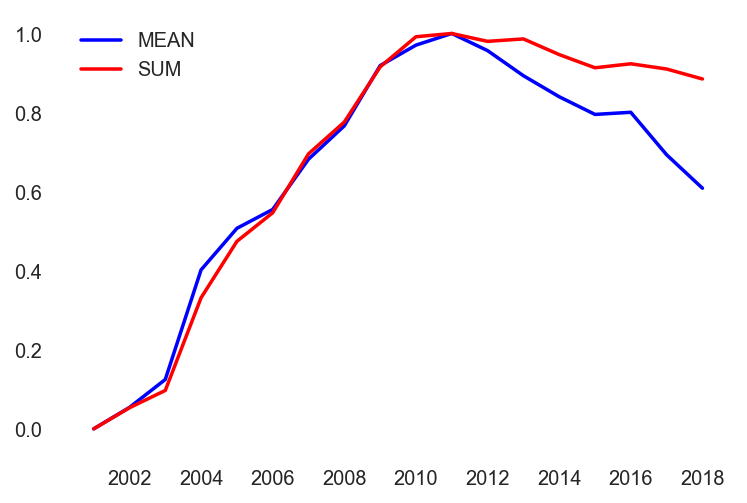

In [26]:
#df.plot.hist()     histogram
#df.plot.bar()      bar chart
#df.plot.barh()     horizontal bar chart
#df.plot.line()     line chart
#df.plot.area()     area chart
#df.plot.scatter()  scatter plot
#df.plot.box()      box plot
#df.plot.kde()      kde plot
#df.plot.hexbin()   hexagonal bin plot
#df.plot.pie()      pie chart

#df_count_day_month_type_teeste = df_count_day_type.transpose()

#display(df_count_day_month_type_teeste[['count']].resample('Y').sum().head(3))
#display(df_count_day_month_type_teeste[['count']].resample('Y').mean().head(3))



#fig, (ax1,ax2) = plt.subplots(2,1, figsize=(15,10), constrained_layout=True)
#plt.plot(df_count_day_month_type_teeste[['count']].resample('Y').mean(),label='MEDIA COUNT')
#plt.plot(df_count_day_month_type_teeste[['count']].resample('Y').sum(),label='SOMA COUNT')

dfMeean = df_count_day_month_type_teeste[['count']].resample('Y').mean().reset_index()
dfSuum = df_count_day_month_type_teeste[['count']].resample('Y').sum().reset_index()

display(dfMeean.head(3))
display(dfSuum.head(3))

dfMeanSum = pd.merge(dfMeean,dfSuum,on='judgmentDate')

dfMeanSum.index = dfMeanSum['judgmentDate']
del dfMeanSum['judgmentDate']

dfMeanSumNorm=(dfMeanSum-dfMeanSum.min())/(dfMeanSum.max()-dfMeanSum.min())
#display(dfMeanSumNorm.head(3))
dfMeanSumNorm = dfMeanSumNorm.reset_index()
#display(dfMeanSumNorm.head(3))

plt.plot(dfMeanSumNorm['judgmentDate'], dfMeanSumNorm['count_x'],'b-',  label='MEAN')
plt.plot(dfMeanSumNorm['judgmentDate'], dfMeanSumNorm['count_y'],'r-',  label='SUM')

plt.legend(loc='best')
plt.show()



<div class="alert alert-info"><h1> Análise de Tendência
</h1>
    <hr/>
</div>



# SatsModels

In [27]:
from statsmodels.tsa.filters.hp_filter import hpfilter

In [28]:
#atribuindo Valores Novos Independentes

df_t_day = df_count_day_type 
df_t_week = df_count_week_day_type 
df_t_YM = df_count_year_month_type 

display(df_t_day.head(2))
display(df_t_YM.head(2))


,judgmentDate,type,count,weekDay,weekType,Dia,Mes,Ano,Feriado
0,2000-01-03,Agravo de Instrumento,2,0,DiaSemana,3,1,2000,False
1,2000-01-06,Agravo de Instrumento,1,3,DiaSemana,6,1,2000,False


,yearMonth,type,count
0,2000-01-01,Agravo de Instrumento,12
1,2000-02-01,Ação Rescisória,1


In [29]:
#Transoforma o indice em DATETIME

df_t_day.index = pd.to_datetime(df_t_day['judgmentDate'])
df_t_YM.index = pd.to_datetime(df_t_YM['yearMonth'])
#display(df_t_day.head(1))
#display(df_t_YM.head(1))

del df_t_day['judgmentDate']
del df_t_YM['yearMonth']

display(df_t_day.head(1))
display(df_t_YM.head(1))

#print(df_t_week['weekDay'].count())
#print(df_t_YM['yearMonth'].count())
#display(df_t_week.head(3))
#print(df_t_day.index)
#print(df_t_week.index)
#print(df_t_YM.index)

,type,count,weekDay,weekType,Dia,Mes,Ano,Feriado
judgmentDate,,,,,,,,
2000-01-03,Agravo de Instrumento,2,0,DiaSemana,3,1,2000,False


,type,count
yearMonth,,
2000-01-01,Agravo de Instrumento,12


### Somar todas 

In [30]:
#Agrupa todas as informações 
print('Antes do agrupamento: ',df_t_day['count'].count())
df_t_day = df_t_day.groupby('judgmentDate').agg({'count':'sum'})
df_t_YM = df_t_YM.groupby('yearMonth').agg({'count':'sum'})
print('Depois do agrupamento: ',df_t_day.count())

Antes do agrupamento:  63765
Depois do agrupamento:  count    5790
dtype: int64


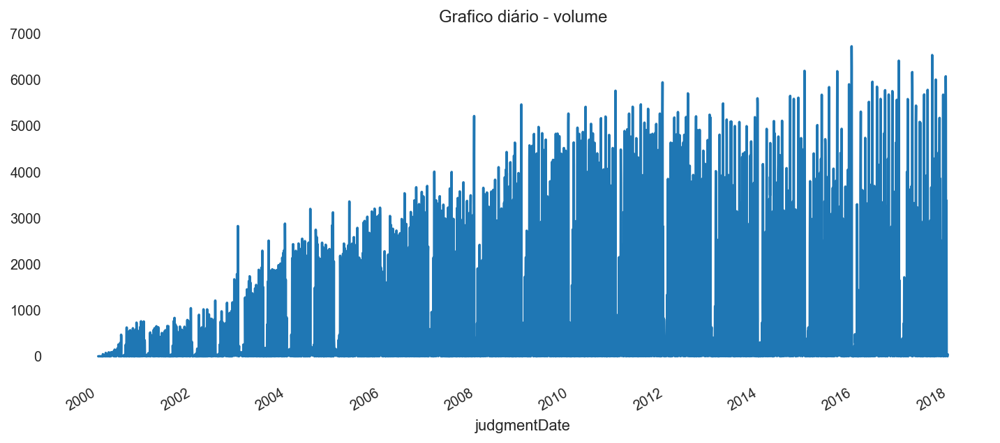

In [31]:
df_t_day['count'].plot.line(figsize=(12,5),title='Grafico diário - volume')

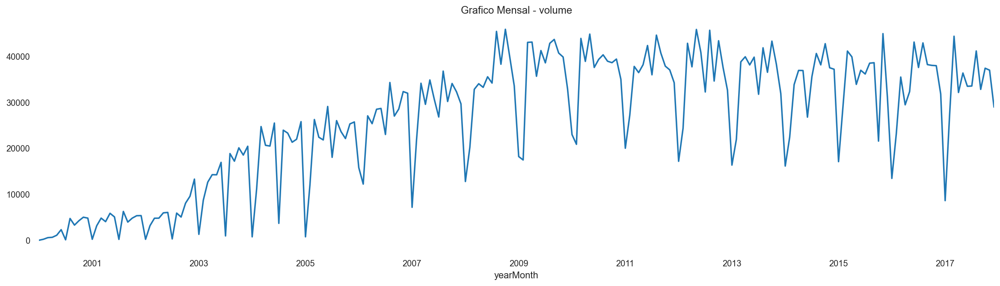

In [32]:
df_t_YM['count'].plot.line(figsize=(20,5),title='Grafico Mensal - volume')

In [33]:
from statsmodels.tsa.filters.hp_filter import hpfilter
#Verificar Tendencia
year_cycle,year_trend = hpfilter(df_t_YM['count'],lamb=1600)
day_cycle,day_trend = hpfilter(df_t_day['count'],lamb=1600)

In [34]:
df_t_day['trend'] = day_trend
df_t_YM['trend'] = year_trend

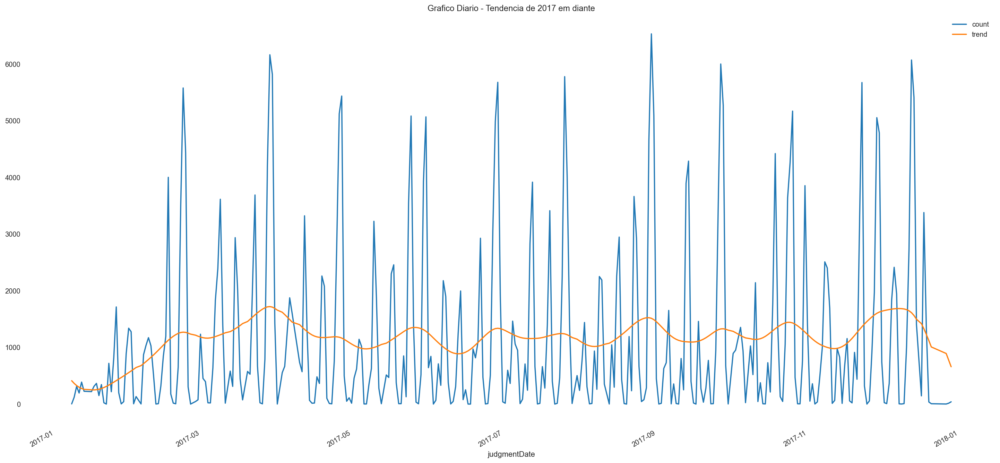

In [35]:
df_t_day[['count','trend']]['2017-01-01':].plot.line(figsize=(25,12),title='Grafico Diario - Tendencia de 2017 em diante')
#df_t_day[['count','trend']].plot.line(figsize=(20,25))

,count,trend
yearMonth,,
2000-01-01,12,716.351039
2000-02-01,222,942.719092
2000-03-01,576,1168.646925


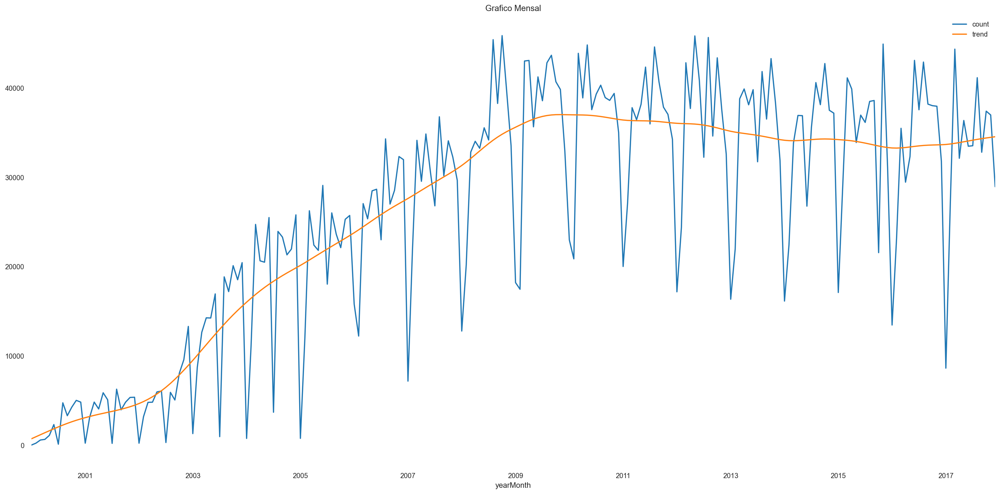

In [36]:
display(df_t_YM.head(3))
#df_t_YM[['count','trend']]['2017-11-01':].plot.line(figsize=(25,10))
df_t_YM[['count','trend']].plot.line(figsize=(25,12),title='Grafico Mensal')


<div class="alert alert-info"><h1> ETS
</h1>
    <hr/>
</div>



In [37]:
#O diario não tem como, pois mesmo que transforme ele pra semanal, continua sem ter alguns valores ... 

#df_t_day_ets = df_t_day
df_t_YM_ets = df_t_YM

In [38]:
#display(df_t_day.head(3))
display(df_t_YM.head(3))
#df_t_day_ets.index = pd.to_datetime(df_t_day_ets.index)
df_t_YM_ets.index = pd.to_datetime(df_t_YM_ets.index)


#df_t_day_ets = df_t_day_ets.asfreq('w')


,count,trend
yearMonth,,
2000-01-01,12,716.351039
2000-02-01,222,942.719092
2000-03-01,576,1168.646925


In [39]:
#precisa remover os NaN
#print(df_t_day_ets.isna().sum())
#df_t_day_ets.dropna(inplace=True)
#print(df_t_day_ets.isna().sum())
print(df_t_YM_ets.isna().sum())
print(df_t_YM_ets.isna().count())

count    0
trend    0
dtype: int64
count    216
trend    216
dtype: int64



<div class="alert alert-warning">
    <h2>Utilizar additive ou multiplicative? </h2>
    <h4>Multiplicative quando o crescimento é exponencial</h4>
    <h4>Multiplicative quando o crescimento é linear</h4>
    <hr/>
</div>


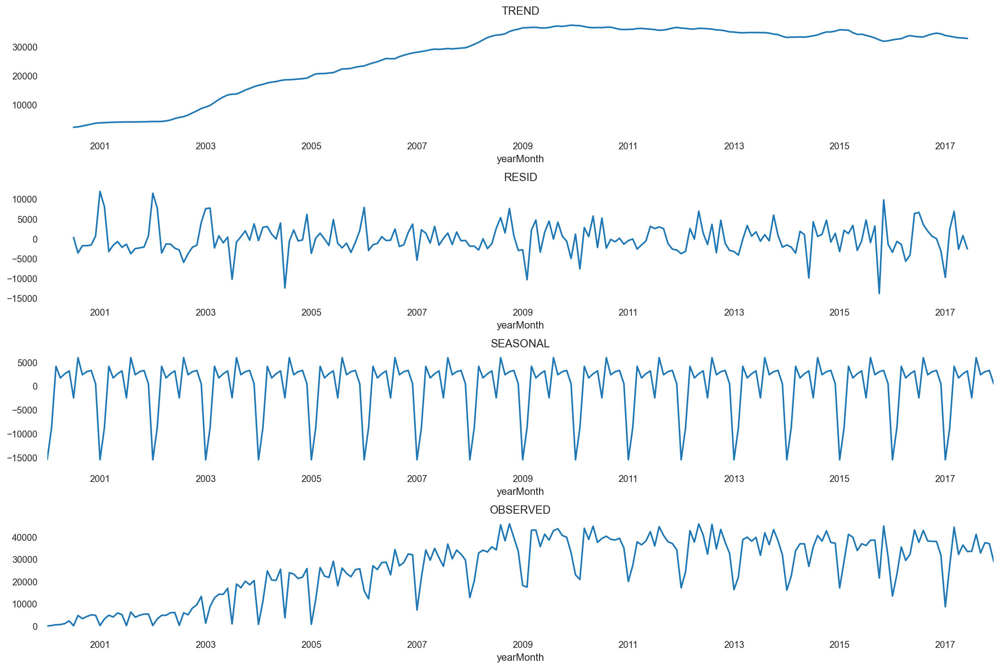

In [40]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt 

#multiplicative usar quando é exponencial
#usar quando é linear 

#result_YM = seasonal_decompose(df_t_YM_ets['count'],model='multiplicative')
result_YM = seasonal_decompose(df_t_YM_ets['count'],model='additive')

fig, (ax1,ax2,ax3,ax4) = plt.subplots(4,1, figsize=(15,10), constrained_layout=True)
result_YM.trend.plot(ax=ax1,title='TREND')
result_YM.resid.plot(ax=ax2,title='RESID')
result_YM.seasonal.plot(ax=ax3,title='SEASONAL')
result_YM.observed.plot(ax=ax4,title='OBSERVED');




<div class="alert alert-warning">    
    <h4>Existe algo a ser obsevado nos graficos acima?</h4>    
    <hr/>
</div>






<div class="alert alert-info"><h1> EWMA
</h1>
    <hr/>
</div>


In [41]:
df_ewma_day = df_count_day_type 
df_ewma_week = df_count_week_day_type 
df_ewma_YM = df_count_year_month_type 

display(df_ewma_day.head(1))
display(df_ewma_YM.head(1))
#display(df_ewma_day.dtype)
#display(df_ewma_YM.dtype)

,type,count,weekDay,weekType,Dia,Mes,Ano,Feriado
judgmentDate,,,,,,,,
2000-01-03,Agravo de Instrumento,2,0,DiaSemana,3,1,2000,False


,type,count
yearMonth,,
2000-01-01,Agravo de Instrumento,12


In [42]:
df_ewma_day.index = pd.to_datetime(df_ewma_day.index)
df_ewma_YM.index = pd.to_datetime(df_ewma_YM.index)
#display(df_ewma_day.head(1))
#display(df_ewma_YM.head(1))
#display(df_ewma_day.index)
#display(df_ewma_YM.index)

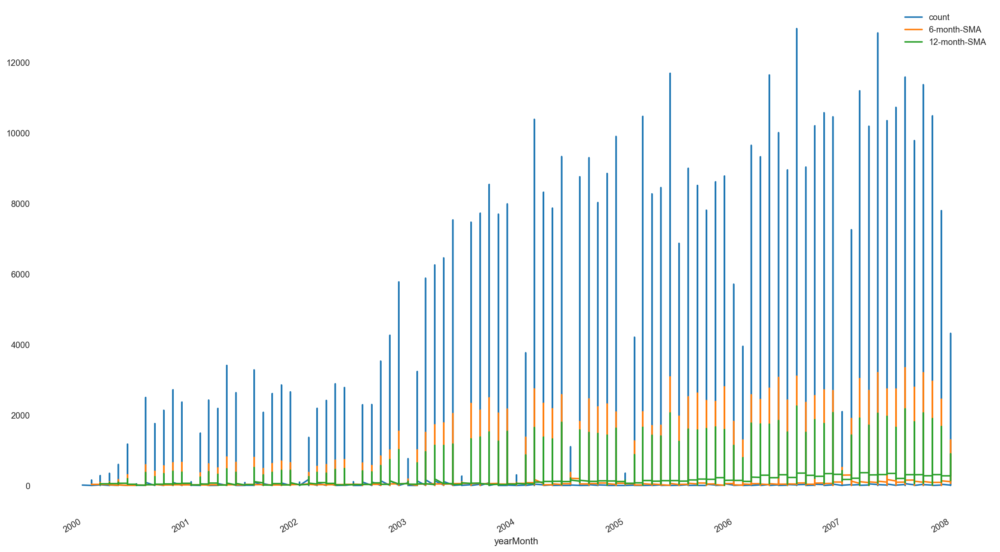

In [43]:
df_ewma_YM_last_8Years = df_ewma_YM['2000-01-01':'2008-01-01']

df_ewma_YM_last_8Years['6-month-SMA'] = df_ewma_YM_last_8Years['count'].rolling(window=6).mean()
df_ewma_YM_last_8Years['12-month-SMA'] = df_ewma_YM_last_8Years['count'].rolling(window=12).mean()
df_ewma_YM_last_8Years.plot.line(figsize=(20,12));


<div class="alert alert-warning">    
    <h4>Grafico acima ficou muito poluido. </h4>        
    <hr/>
    <h4>Abaixo vou somar por meses nos anos de todas as series. </h4>    
</div>


,yearMonth,count
yearMonth,,
2000-01-01,2000-01-01 00:00:00.000,12
2000-02-01,2000-02-01 00:00:00.000,222
2000-03-01,2000-03-01 00:00:00.000,576


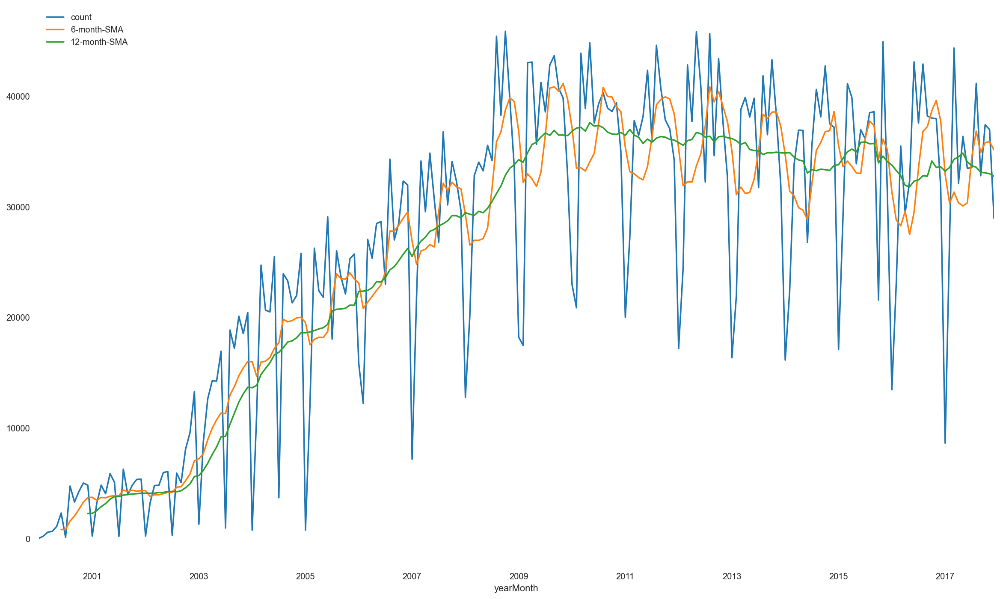

In [44]:
df_ewma_YM_aux =df_ewma_YM.reset_index()
df_ewma_YM_aux['yearMonth'] = pd.to_datetime(df_ewma_YM_aux['yearMonth']).dt.to_period('D')

#df_ewma_YM_aux[['yearMonth','count']].groupby(['yearMonth']).agg({'count':'sum'}).head(3)
df_ewma_year_grp = df_ewma_YM_aux[['yearMonth','count']].groupby(['yearMonth']).agg({'count':'sum'}).reset_index()
df_ewma_year_grp['yearMonth'] = df_ewma_year_grp['yearMonth'].dt.to_timestamp('s').dt.strftime('%Y-%m-%d %H:%M:%S.000')
df_ewma_year_grp.index = pd.to_datetime(df_ewma_year_grp['yearMonth'])
display(df_ewma_year_grp.head(3))

df_ewma_year_grp['6-month-SMA'] = df_ewma_year_grp['count'].rolling(window=6).mean()
df_ewma_year_grp['12-month-SMA'] = df_ewma_year_grp['count'].rolling(window=12).mean()
del df_ewma_year_grp['yearMonth']
df_ewma_year_grp.plot.line(figsize=(20,12));

<div class="alert alert-warning">    
    <h4>Grafico acima a média não alcança os picos ...  </h4>        
    <hr/>    
</div>

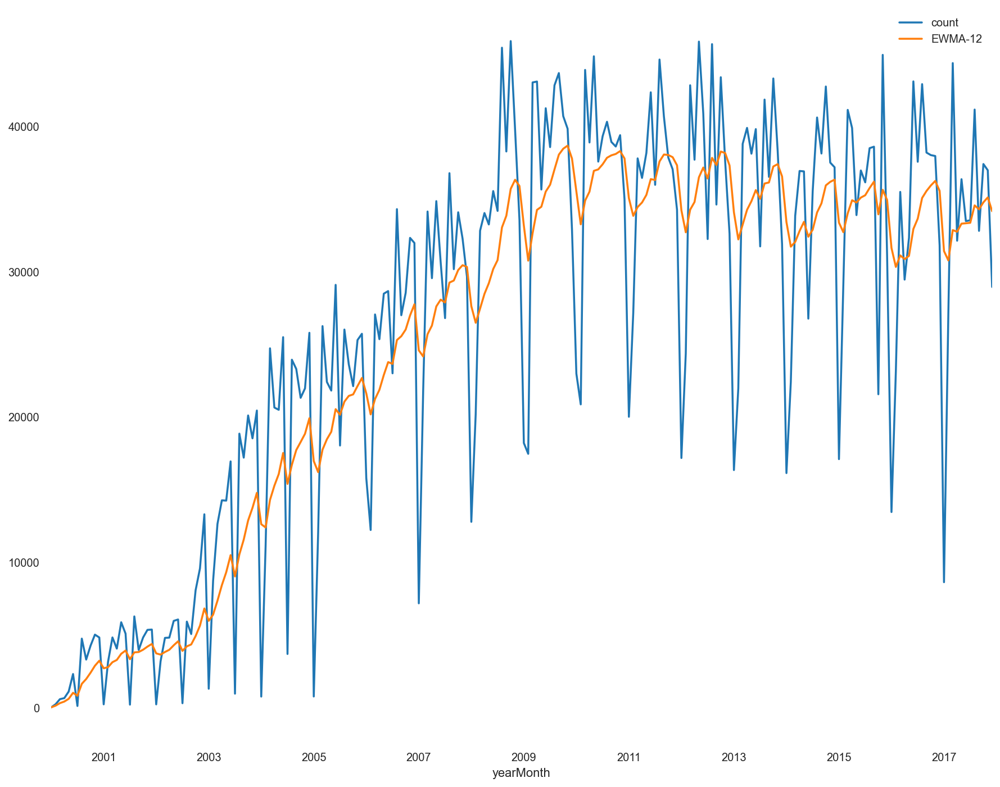

In [45]:
df_ewma_year_grp['EWMA-12'] = df_ewma_year_grp['count'].ewm(span=12).mean()
df_ewma_year_grp[['count','EWMA-12']].plot(figsize=(15,12));


<div class="alert alert-info"><h1> Holt - Winters Methods
</h1>
    <hr/>
    <h3> Pegando apenas um dos tipos, se não fica impossivel analisar. 
</h3>
</div>

In [46]:
df_Holt_day = df_count_day_type 
df_Holt_week = df_count_week_day_type 
df_Holt_YM = df_count_year_month_type 

display(df_Holt_day.head(1))
display(df_Holt_YM.head(1))

#display(df_Holt_day.index)
#display(df_Holt_YM.index)

df_Holt_YM = df_Holt_YM[df_Holt_YM['type']=='Agravo de Instrumento']


,type,count,weekDay,weekType,Dia,Mes,Ano,Feriado
judgmentDate,,,,,,,,
2000-01-03,Agravo de Instrumento,2,0,DiaSemana,3,1,2000,False


,type,count
yearMonth,,
2000-01-01,Agravo de Instrumento,12


In [47]:
df_Holt_YM.dropna(inplace=True)
df_Holt_YM.index.asfreq = 'A'

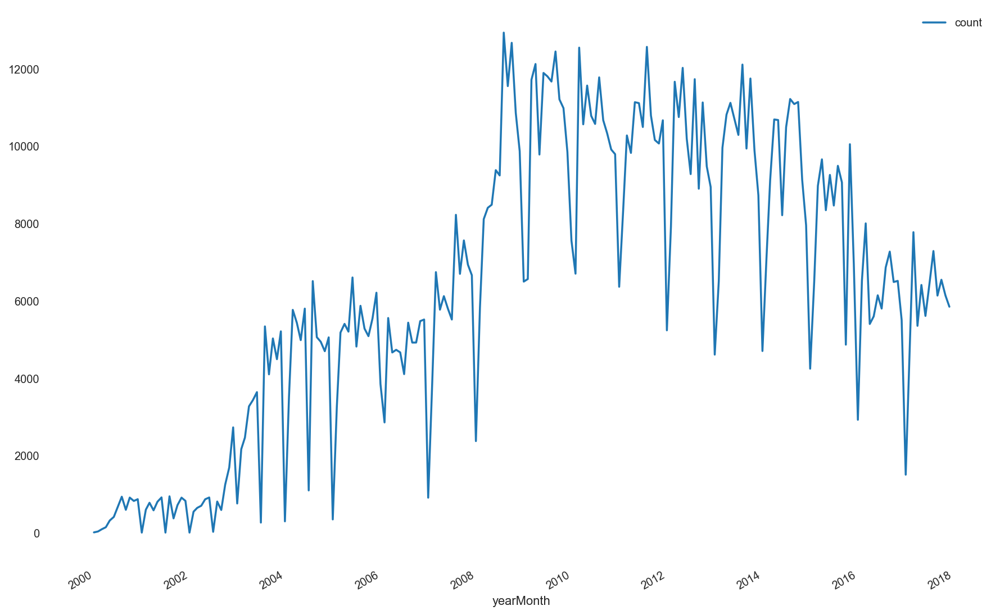

In [48]:
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
df_Holt_YM.plot(figsize=(15,10))

In [49]:
span = 12 
alpha = 2/(span+1)

In [50]:
df_Holt_YM['EWMA12'] = df_Holt_YM['count'].ewm(alpha=alpha,adjust=False).mean()

In [51]:
df_Holt_YM.head()
model = SimpleExpSmoothing(df_Holt_YM['count'])

In [52]:
fitted_model = model.fit(smoothing_level=alpha, optimized=False)

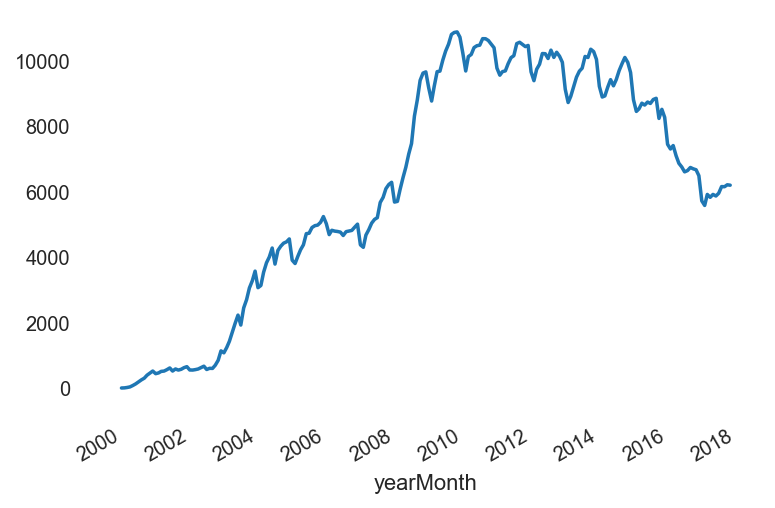

In [53]:
fitted_model.fittedvalues.shift(-1).plot()

In [54]:
df_Holt_YM['SES12']=SimpleExpSmoothing(df_Holt_YM['count']).fit(smoothing_level=alpha, optimized=False).fittedvalues.shift(-1)

In [55]:
df_Holt_YM

,type,count,EWMA12,SES12
yearMonth,,,,
2000-01-01,Agravo de Instrumento,12,12.000000,12.000000
2000-02-01,Agravo de Instrumento,35,15.538462,15.538462
2000-03-01,Agravo de Instrumento,93,27.455621,27.455621
2000-04-01,Agravo de Instrumento,145,45.539372,45.539372
2000-05-01,Agravo de Instrumento,319,87.610238,87.610238
...,...,...,...,...
2017-08-01,Agravo de Instrumento,7286,6163.789056,6163.789056
2017-09-01,Agravo de Instrumento,6134,6159.206125,6159.206125
2017-10-01,Agravo de Instrumento,6543,6218.251336,6218.251336


In [56]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

df_Holt_YM['DES_add_12'] = ExponentialSmoothing(df_Holt_YM['count'],trend='add').fit().fittedvalues.shift(-1)
df_Holt_YM['DES_mul_12'] = ExponentialSmoothing(df_Holt_YM['count'],trend='mul').fit().fittedvalues.shift(-1)
df_Holt_YM.head()

,type,count,EWMA12,SES12,DES_add_12,DES_mul_12
yearMonth,,,,,,
2000-01-01,Agravo de Instrumento,12,12.000000,12.000000,60.901477,321.187584
2000-02-01,Agravo de Instrumento,35,15.538462,15.538462,81.840400,137.434460
2000-03-01,Agravo de Instrumento,93,27.455621,27.455621,114.022622,75.917452
2000-04-01,Agravo de Instrumento,145,45.539372,45.539372,152.217006,63.283143
2000-05-01,Agravo de Instrumento,319,87.610238,87.610238,231.611030,101.106020


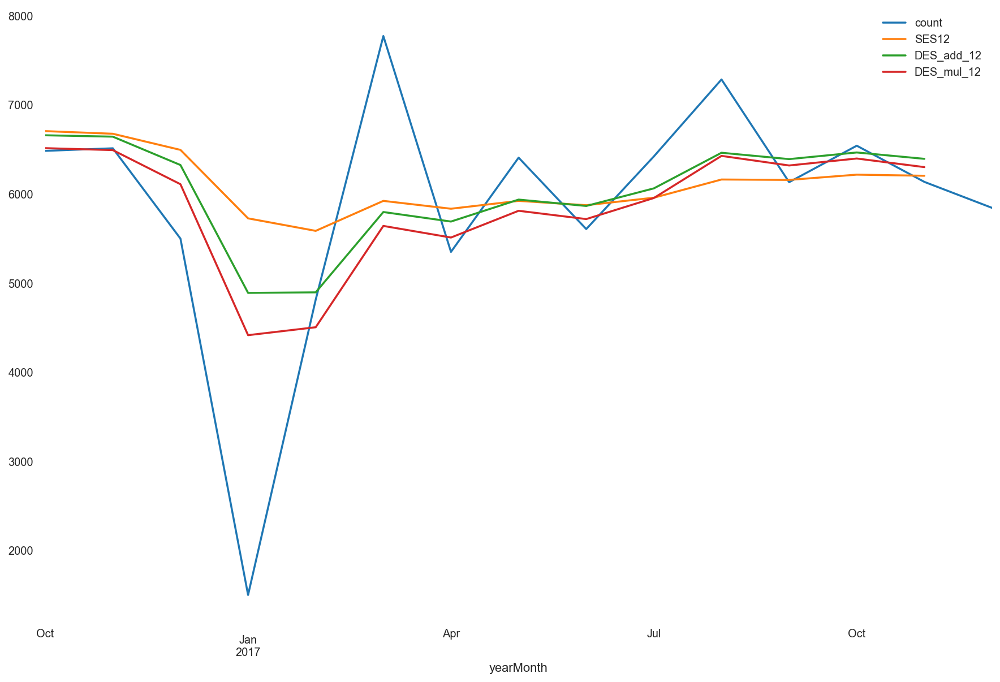

In [57]:
df_Holt_YM[['type', 'count', #'6-month-SMA', '12-month-SMA', 'EWMA12'
             'SES12','DES_add_12','DES_mul_12']].iloc[200:].plot(figsize=(15,10));

In [58]:
df_Holt_YM['TES_add_12'] = ExponentialSmoothing(df_Holt_YM['count'],trend='add',seasonal='add',seasonal_periods=12).fit().fittedvalues


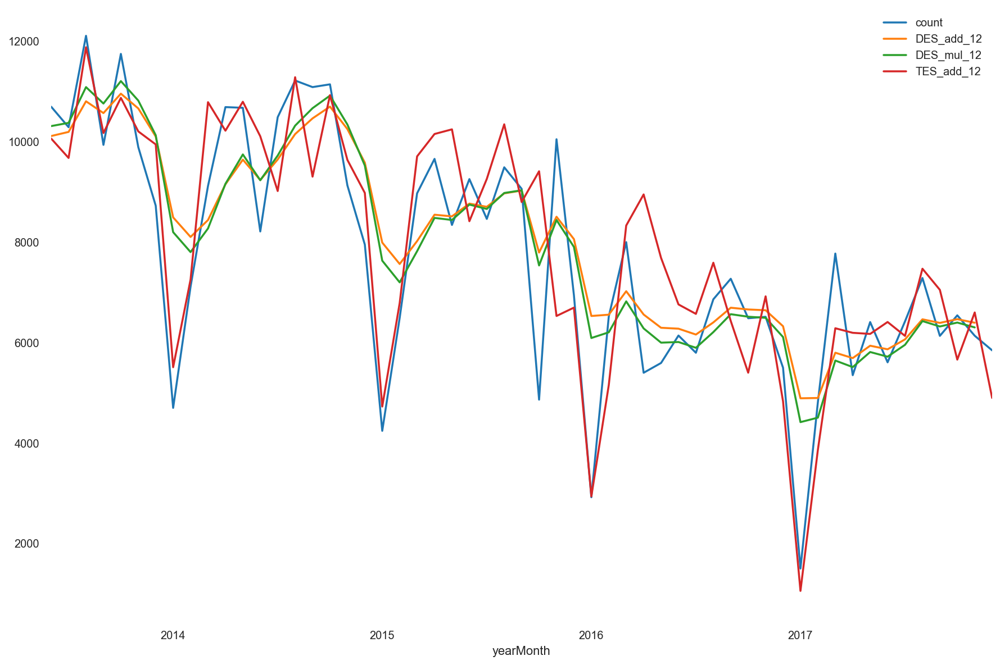

In [59]:
df_Holt_YM[['type', 'count', #'6-month-SMA', '12-month-SMA', 'EWMA12'
            # 'SES12',
            'DES_add_12',
            'DES_mul_12','TES_add_12']].iloc[160:].plot(figsize=(15,10));

In [60]:
df_Holt_YM

,type,count,EWMA12,SES12,DES_add_12,DES_mul_12,TES_add_12
yearMonth,,,,,,,
2000-01-01,Agravo de Instrumento,12,12.000000,12.000000,60.901477,321.187584,68.671926
2000-02-01,Agravo de Instrumento,35,15.538462,15.538462,81.840400,137.434460,201.409118
2000-03-01,Agravo de Instrumento,93,27.455621,27.455621,114.022622,75.917452,287.232950
2000-04-01,Agravo de Instrumento,145,45.539372,45.539372,152.217006,63.283143,364.447820
2000-05-01,Agravo de Instrumento,319,87.610238,87.610238,231.611030,101.106020,551.725953
...,...,...,...,...,...,...,...
2017-08-01,Agravo de Instrumento,7286,6163.789056,6163.789056,6463.859612,6428.822990,7470.909250
2017-09-01,Agravo de Instrumento,6134,6159.206125,6159.206125,6392.586104,6321.122777,7050.469830
2017-10-01,Agravo de Instrumento,6543,6218.251336,6218.251336,6467.014200,6399.294900,5662.016092



<div class="alert alert-info"><h1> FORECASTING
</h1>
    <hr/>
    <h3> 
</h3>
</div>

In [318]:
df_Holt_day = df_count_day_type#[['type','count']] 
df_Holt_week = df_count_week_day_type#[['type','count']] 
df_Holt_YM = df_count_year_month_type#[['type','count']]  

display(df_Holt_day.head(2))
display(df_Holt_YM.head(2))


df_Holt_YM = df_Holt_YM[df_Holt_YM['type']=='Agravo de Instrumento']
df_Holt_day = df_Holt_day[df_Holt_day['type']=='Agravo de Instrumento']


,type,count,weekDay,weekType,Dia,Mes,Ano,Feriado
judgmentDate,,,,,,,,
2000-01-03,Agravo de Instrumento,2,0,DiaSemana,3,1,2000,False
2000-01-06,Agravo de Instrumento,1,3,DiaSemana,6,1,2000,False


,type,count
yearMonth,,
2000-01-01,Agravo de Instrumento,12
2000-02-01,Ação Rescisória,1


In [319]:
df_Holt_YM.dropna(inplace=True)
df_Holt_YM.index.asfreq = 'A'
df_Holt_YM.tail()


df_Holt_day.dropna(inplace=True)
df_Holt_day.index.asfreq = 'MS'
df_Holt_day.tail()

df_Holt_YM=df_Holt_YM[['type','count']]
df_Holt_day = df_Holt_day[['type','count']]

In [320]:
print(df_Holt_YM.count())
trainY = df_Holt_YM.iloc[:179]
testY = df_Holt_YM.iloc[179:]
print(trainY.count())
display(trainY.tail(1))
print(testY.count())
display(testY.head(1))

print('---------')

print(df_Holt_day.count())
trainD = df_Holt_day.iloc[:4000]
testD = df_Holt_day.iloc[4000:]
print(trainD.count())
display(trainD.tail(1))
print(testD.count())
display(testD.head(1))

type     215
count    215
dtype: int64
type     179
count    179
dtype: int64


,type,count
yearMonth,,
2014-12-01,Agravo de Instrumento,7951


type     36
count    36
dtype: int64


,type,count
yearMonth,,
2015-01-01,Agravo de Instrumento,4244


---------
type     5369
count    5369
dtype: int64
type     4000
count    4000
dtype: int64


,type,count
judgmentDate,,
2013-11-14,Agravo de Instrumento,526


type     1369
count    1369
dtype: int64


,type,count
judgmentDate,,
2013-11-15,Agravo de Instrumento,17


2000-01-01 00:00:00
2015-01-01 00:00:00
2000-01-03 00:00:00
2013-11-15 00:00:00


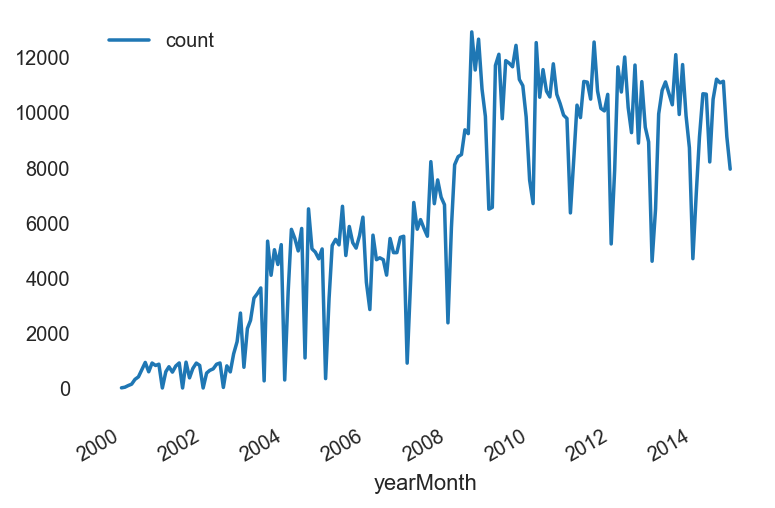

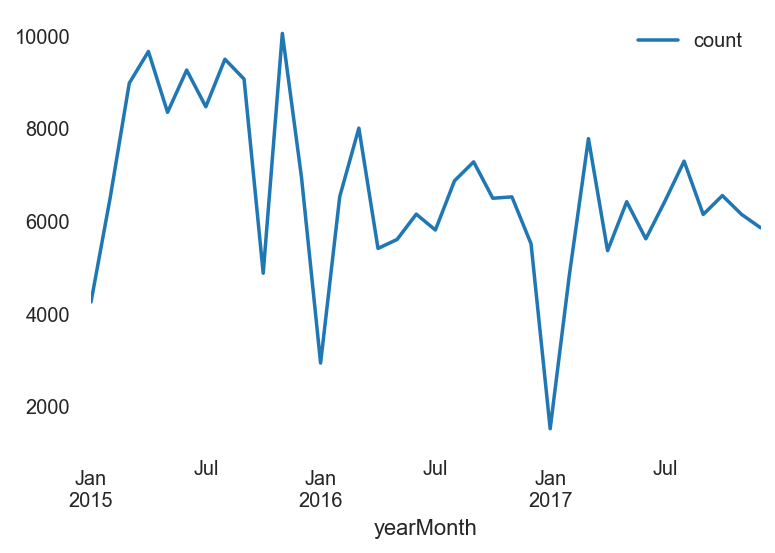

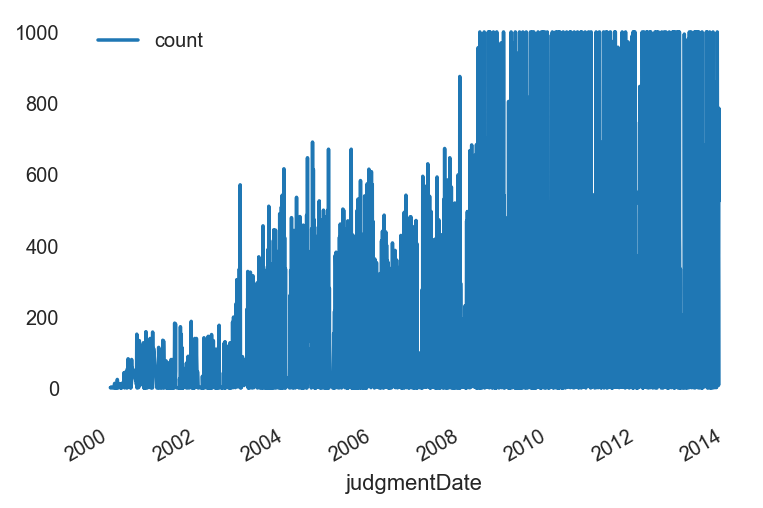

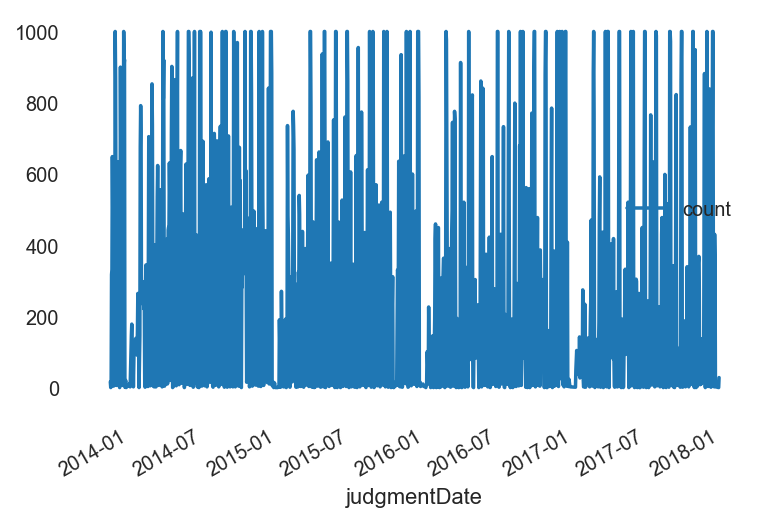

In [321]:
trainY.plot(legend=True,label='Train')
testY.plot(legend=True,label='Test')
print(trainY.index[0])
print(testY.index[0])

trainD.plot(legend=True,label='Train')
testD.plot(legend=True,label='Test')
print(trainD.index[0])
print(testD.index[0])

#print(train.info(),'-----',test.info())


In [322]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing
trainY = trainY[['count']]
testY = testY[['count']]
print(type(trainY))
print(type(testY))
print(trainY.head(1))
print(testY.head(1))

trainD = trainD[['count']]
testD = testD[['count']]
print(type(trainD))
print(type(testD))
print(trainD.head(1))
print(testD.head(1))


<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
            count
yearMonth        
2000-01-01     12
            count
yearMonth        
2015-01-01   4244
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
              count
judgmentDate       
2000-01-03        2
              count
judgmentDate       
2013-11-15       17


In [412]:
fittedModel = ExponentialSmoothing(testY['count'],trend='mul',seasonal='mul',seasonal_periods=12).fit()

In [416]:
test_predictions = fittedModel.forecast(72).rename('HW Forecast')

In [417]:
display(test_predictions.count())
display(test_predictions.head(1))

72

2018-01-01    2165.585011
Freq: MS, Name: HW Forecast, dtype: float64

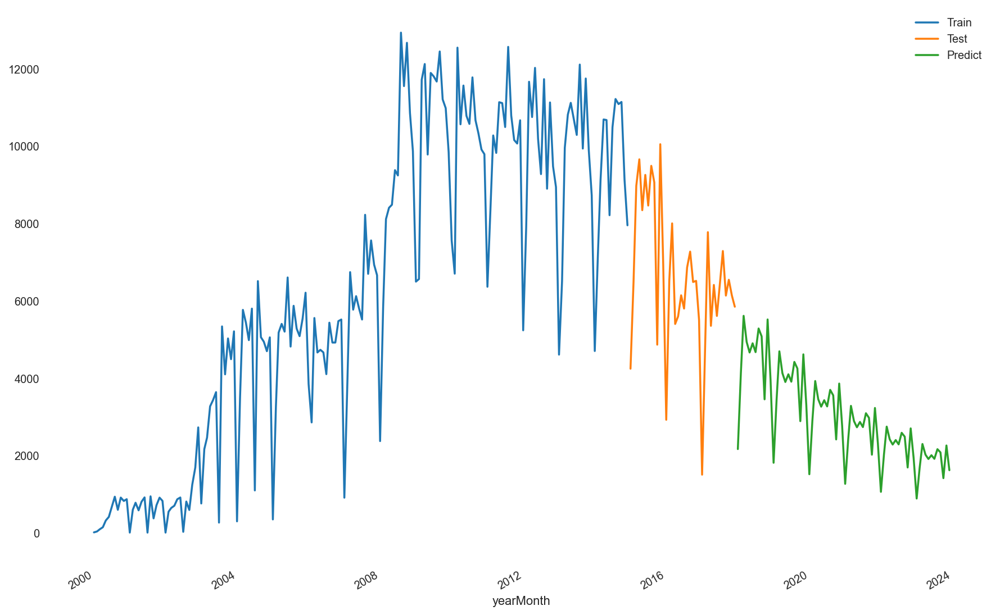

In [418]:
train['count'].plot(legend=True,label='Train',figsize=(15,10))
test['count'].plot(legend=True,label='Test')
test_predictions.plot(legend=True,label='Predict');


<div class="alert alert-danger"><h1> No gráfico acima tentando por ano (no teste) ou por dia (treino e teste) acontece um erro.
    <span style="color:green">Assim, funcionou apenas o por ano no treino</span> 
</h1>
    <hr/>
    <h3>Rejeiçao de hipotese nula?        
</h3>
    <h4>
    Com o treino  no anual: some o indice (mas ele está la, porem quando retorna do fit ele nao tem mais datas)
    Com o diario: mesmo colocando periodos maiores como 365 a data some .... e da o mesmo erro do acima.
    </h4>
    
    
ValueError: view limit minimum -36645.25 is less than 1 and is an invalid Matplotlib date value. This often happens if you pass a non-datetime value to an axis that has datetime units
    
    
</div>